## Lane Shape Modeling
1) load the trained Instance Segmentation model
2) predict lane masks
3) fit mathematical equations (Polynomials/Splines) to the detected lanes.

In [36]:
import os
import json
import cv2
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
import matplotlib.pyplot as plt


# Configuration
BASE_DIR = os.getcwd()
DATA_DIR = r'C:\Users\Alex\Documents\Clase\Italia\Segundo_ano\ADAS\Project\TU_Simple_folder\TUSimple'
TRAIN_SET_DIR = os.path.join(DATA_DIR, 'train_set')
PROCESSED_DATA_DIR = os.path.join(DATA_DIR, r'processed\instance')
CHECKPOINT_DIR = os.path.join(BASE_DIR, r'checkpoints\instance')
eval_filename = f'best_model_instance_e20.pth'
EVAL_MODEL_PATH = os.path.join(CHECKPOINT_DIR, eval_filename)
# Polynomial degree to fit
polynomial_degree = 2 

NUM_CLASSES = 6 
IMG_HEIGHT = 288
IMG_WIDTH = 512
EPOCHS = 5 
BATCH_SIZE = 8
LEARNING_RATE = 5*1e-4
model_filename = f'best_model_instance_e{EPOCHS}.pth'
BEST_MODEL_PATH = os.path.join(CHECKPOINT_DIR, model_filename)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda


## 1. Model & Dataset Definitions
Same as lane detection

In [37]:
class TuSimpleDataset(Dataset):
    def __init__(self, root_dir, processed_dir, json_files, transform=None):
        self.root_dir = root_dir
        self.processed_dir = processed_dir
        self.transform = transform
        self.samples = []

        for json_file in json_files:
            json_path = os.path.join(root_dir, json_file)
            if not os.path.exists(json_path):
                continue
                
            with open(json_path, 'r') as f:
                lines = f.readlines()
            
            for line in lines:
                info = json.loads(line)
                raw_file = info['raw_file']
                mask_file = raw_file.replace('.jpg', '.png')
                img_path = os.path.join(self.root_dir, raw_file)
                mask_path = os.path.join(self.processed_dir, mask_file)
                self.samples.append((raw_file, mask_file))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_rel_path, mask_rel_path = self.samples[idx]
        img_path = os.path.join(self.root_dir, img_rel_path)
        mask_path = os.path.join(self.processed_dir, mask_rel_path)
        
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        
        image = cv2.resize(image, (IMG_WIDTH, IMG_HEIGHT))
        mask = cv2.resize(mask, (IMG_WIDTH, IMG_HEIGHT), interpolation=cv2.INTER_NEAREST)

        image = image.astype(np.float32) / 255.0
        image = np.transpose(image, (2, 0, 1))
        image = torch.from_numpy(image).float()
        mask = torch.from_numpy(mask).long()
        return image, mask

In [38]:
# U-Net Architecture
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
    def forward(self, x):
        return self.double_conv(x)

class Down(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )
    def forward(self, x):
        return self.maxpool_conv(x)

class Up(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=2, stride=2)
        self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])
        
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)
    def forward(self, x):
        return self.conv(x)

class UNet(nn.Module):
    def __init__(self, n_channels, n_classes):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.inc = DoubleConv(n_channels, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        self.down4 = Down(512, 1024)
        self.up1 = Up(1024, 512)
        self.up2 = Up(512, 256)
        self.up3 = Up(256, 128)
        self.up4 = Up(128, 64)
        self.outc = OutConv(64, n_classes)
    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        out = self.outc(x)
        return out

## 3. Execution & Visualization

In [39]:
def evaluate_shapes(model_path, data_dir, processed_dir, json_files, polydegree):
    # Number of random samples to visualize (this function is for qualitative inspection)
    num_visualize = 20
    dataset = TuSimpleDataset(data_dir, processed_dir, json_files)
    loader = DataLoader(dataset, batch_size=1, shuffle=True, num_workers=0)
    
    model = UNet(n_channels=3, n_classes=NUM_CLASSES).to(device)
    model.load_state_dict(torch.load(model_path, map_location=device))

    model.eval()
    
    # Colors for visualization (up to 5 lanes)
    colors = [
        (0, 0, 0),       # Background
        (0, 255, 0),     # Lane 1
        (255, 0, 0),     # Lane 2
        (0, 0, 255),     # Lane 3
        (255, 255, 0),   # Lane 4
        (255, 0, 255)    # Lane 5
    ]
    
    count = 0
    
    with torch.no_grad():
        for images, masks in tqdm(loader, desc="Fitting Shapes"):
            if count >= num_visualize: break
            
            images = images.to(device)
            
            output = model(images)
            probs = torch.softmax(output, dim=1)
            pred_mask = torch.argmax(probs, dim=1).cpu().numpy()[0]
            
            # Convert image tensor back to uint8 image for OpenCV drawing
            img_np = images[0].cpu().permute(1, 2, 0).numpy()
            img_np = (img_np * 255).astype(np.uint8)
            img_np = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR)
            
            viz_img = img_np.copy()
            
            # Fitting logic
            height, width = pred_mask.shape
            plot_y = np.linspace(0, height-1, height)
            
             # Fit a curve independently for each lane class (1..5)
            for cls_idx in range(1, NUM_CLASSES):
                # Binary mask for current lane class
                lane_mask = (pred_mask == cls_idx).astype(np.uint8)
                
                # Blob filtering
                # Keep only the largest blob if it is "lane-like" (large enough and tall enough)
                lane_mask_uint8 = lane_mask.astype(np.uint8)
                num_labels, labels_im, stats, centroids = cv2.connectedComponentsWithStats(lane_mask_uint8, connectivity=8)
                valid_lane = False
                if num_labels > 1:

                    # Find component with maximum area 
                    largest_idx = np.argmax(stats[1:, cv2.CC_STAT_AREA]) + 1
                    max_area = stats[largest_idx, cv2.CC_STAT_AREA]
                    max_height = stats[largest_idx, cv2.CC_STAT_HEIGHT]
                    
                    # Thresholds to reject small or short components
                    if max_area >= 1000 and max_height >= 50:
                        lane_mask = (labels_im == largest_idx).astype(np.uint8)
                        valid_lane = True
                
                if valid_lane:
                    # Extract lane pixels as x, y coordinates
                    y_coords, x_coords = np.where(lane_mask == 1)
                    
                    # Fit Polynomial
                    lane_fit = np.polyfit(y_coords, x_coords, polydegree) 
                    print(f'Lane {cls_idx} Equation: x = {lane_fit[0]:.6f}*y^2 + {lane_fit[1]:.6f}*y + {lane_fit[2]:.6f}')

                    # Generate points for plotting
                    # Generate points for plotting (Constrained to detected range)
                    min_y = int(np.min(y_coords))
                    plot_y_fit = np.linspace(min_y, height-1, num=(height-min_y))
                    plot_x = np.polyval(lane_fit, plot_y_fit)
                    
                    # Draw onto the visualization image
                    pts = np.array([np.transpose(np.vstack([plot_x, plot_y_fit]))])
                    pts = pts.astype(np.int32)
                    
                    color = colors[cls_idx if cls_idx < len(colors) else 1]
                    cv2.polylines(viz_img, pts, isClosed=False, color=(color[2], color[1], color[0]), thickness=5)
                    
            # Plot
            fig, ax = plt.subplots(1, 3, figsize=(30, 8))
            
            # 1. Ground Truth Overlay
            gt_viz = img_np.copy()
            gt_mask_val = masks[0].cpu().numpy()
            
            for cls_idx in range(1, NUM_CLASSES):
                lane_bool = (gt_mask_val == cls_idx)
                if np.any(lane_bool):
                    color_rgb = colors[cls_idx if cls_idx < len(colors) else 1]
                    gt_viz[lane_bool] = (color_rgb[2], color_rgb[1], color_rgb[0])

            ax[0].set_title("Ground Truth (Projected)")
            ax[0].imshow(cv2.cvtColor(gt_viz, cv2.COLOR_BGR2RGB))
            ax[0].axis('off')

            # 2. Instance Segmentation Prediction (Projected)
            pred_viz = img_np.copy()
            for cls_idx in range(1, NUM_CLASSES):
                # Use pred_mask which causes the drawing logic above
                lane_bool = (pred_mask == cls_idx)
                if np.any(lane_bool):
                    color_rgb = colors[cls_idx if cls_idx < len(colors) else 1]
                    pred_viz[lane_bool] = (color_rgb[2], color_rgb[1], color_rgb[0])
            
            ax[1].set_title("Instance Segmentation Prediction")
            ax[1].imshow(cv2.cvtColor(pred_viz, cv2.COLOR_BGR2RGB))
            ax[1].axis('off')

            # 3. Prediction + Polynomials
            ax[2].set_title("Lane Shape Modeling (Polynomial Fit)")
            ax[2].imshow(cv2.cvtColor(viz_img, cv2.COLOR_BGR2RGB))
            ax[2].axis('off')
            
            plt.show()
            
            count += 1


Fitting Shapes:   0%|          | 0/3626 [00:00<?, ?it/s]

Lane 1 Equation: x = 0.000138*y^2 + -1.316353*y + 384.161401
Lane 2 Equation: x = 0.000217*y^2 + 0.834852*y + 180.511708
Lane 3 Equation: x = 0.002684*y^2 + -4.045740*y + 626.806749
Lane 4 Equation: x = -0.003850*y^2 + 4.350877*y + -124.759634


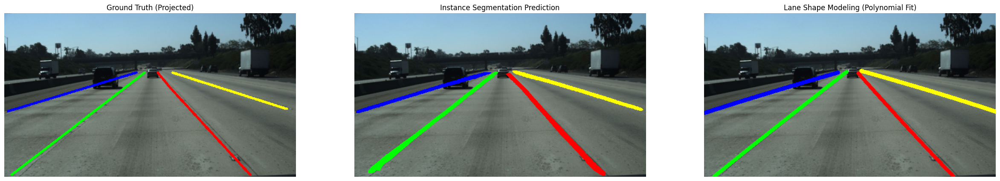

Fitting Shapes:   0%|          | 1/3626 [00:00<26:59,  2.24it/s]

Lane 1 Equation: x = 0.000074*y^2 + -1.004703*y + 363.894399
Lane 2 Equation: x = 0.001948*y^2 + 0.466438*y + 234.306147
Lane 3 Equation: x = 0.001687*y^2 + -3.620849*y + 606.142758
Lane 4 Equation: x = 0.028324*y^2 + -4.839054*y + 558.128720


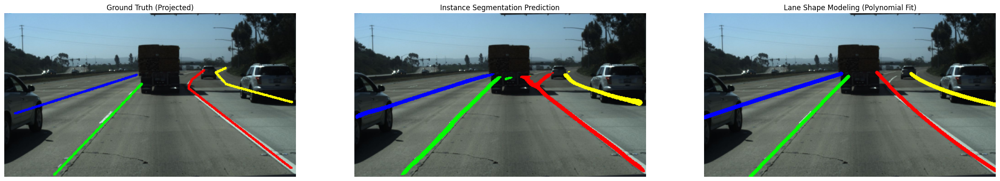

Fitting Shapes:   0%|          | 2/3626 [00:00<22:24,  2.70it/s]

Lane 1 Equation: x = 0.000292*y^2 + -1.228697*y + 380.312780
Lane 2 Equation: x = 0.000208*y^2 + 1.011389*y + 163.959498
Lane 3 Equation: x = 0.002565*y^2 + -3.963817*y + 627.339964
Lane 4 Equation: x = -0.005732*y^2 + 5.039341*y + -180.907024


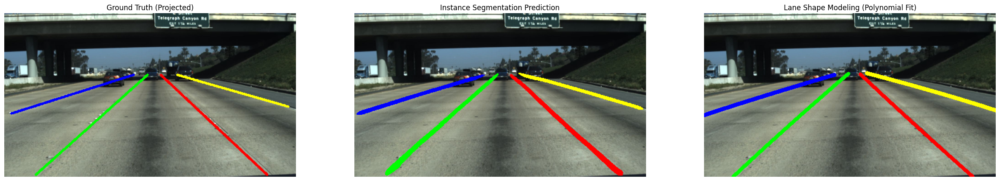

Fitting Shapes:   0%|          | 3/3626 [00:01<21:17,  2.84it/s]

Lane 1 Equation: x = 0.000211*y^2 + -1.041288*y + 364.251179
Lane 2 Equation: x = -0.000189*y^2 + 1.381747*y + 138.961806
Lane 3 Equation: x = 0.001999*y^2 + -3.590024*y + 592.216347
Lane 4 Equation: x = 0.000180*y^2 + 3.535813*y + -70.095452


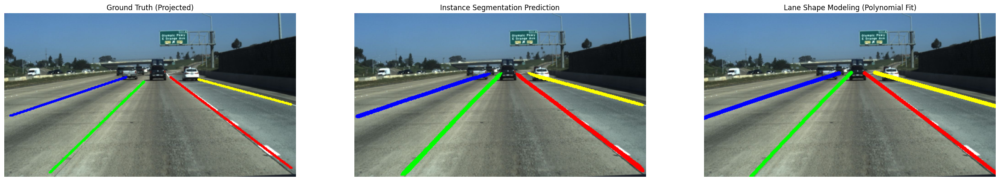

Fitting Shapes:   0%|          | 4/3626 [00:01<19:53,  3.03it/s]

Lane 1 Equation: x = -0.000508*y^2 + -2.963771*y + 526.129882
Lane 2 Equation: x = 0.001020*y^2 + -1.417741*y + 396.721132
Lane 4 Equation: x = -0.000467*y^2 + 1.182519*y + 167.191907


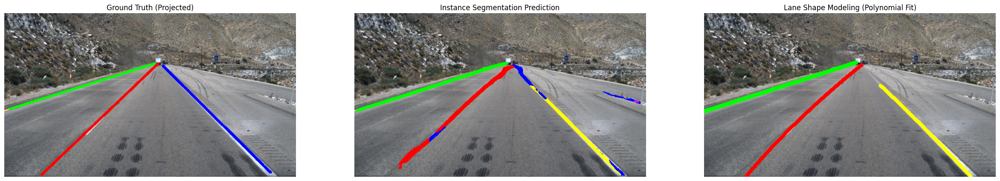

Fitting Shapes:   0%|          | 5/3626 [00:01<20:00,  3.02it/s]

Lane 1 Equation: x = -0.001415*y^2 + -0.242560*y + 294.228908
Lane 2 Equation: x = 0.000299*y^2 + 1.226300*y + 146.752012
Lane 3 Equation: x = 0.000571*y^2 + -2.889776*y + 533.714472
Lane 4 Equation: x = -0.001260*y^2 + 3.761627*y + -83.974334


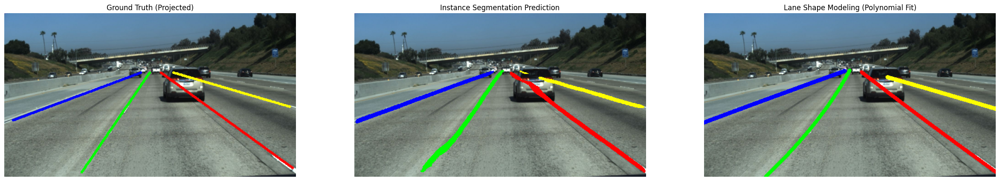

Fitting Shapes:   0%|          | 6/3626 [00:02<19:29,  3.09it/s]

Lane 1 Equation: x = -0.000336*y^2 + -0.879684*y + 351.623669
Lane 2 Equation: x = 0.000117*y^2 + 1.183134*y + 151.216465
Lane 3 Equation: x = 0.001080*y^2 + -3.317170*y + 573.637307
Lane 4 Equation: x = -0.003319*y^2 + 4.347686*y + -122.645922


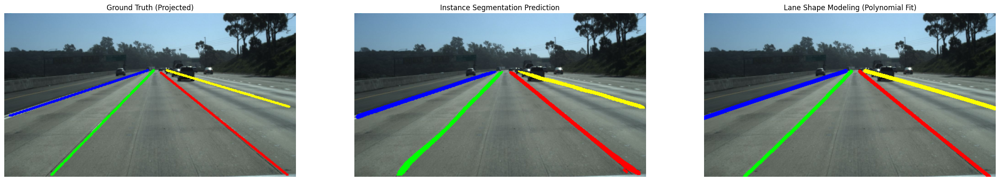

Fitting Shapes:   0%|          | 7/3626 [00:02<19:12,  3.14it/s]

Lane 1 Equation: x = 0.000003*y^2 + -1.053161*y + 365.017082
Lane 2 Equation: x = 0.000037*y^2 + 1.164764*y + 147.478070
Lane 3 Equation: x = -0.001617*y^2 + -2.598708*y + 525.893766
Lane 4 Equation: x = 0.000642*y^2 + 3.285118*y + -63.741570


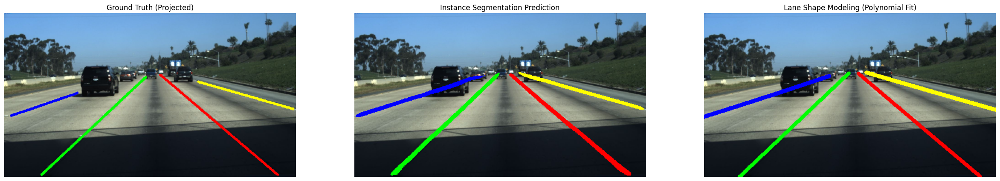

Fitting Shapes:   0%|          | 8/3626 [00:02<19:12,  3.14it/s]

Lane 1 Equation: x = -0.000079*y^2 + -1.010506*y + 358.948373
Lane 2 Equation: x = 0.000028*y^2 + 1.153197*y + 150.179357
Lane 3 Equation: x = -0.000040*y^2 + -3.036463*y + 552.689385
Lane 4 Equation: x = -0.001306*y^2 + 3.822929*y + -95.182171


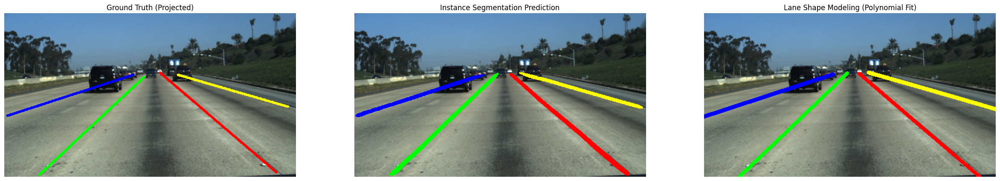

Fitting Shapes:   0%|          | 9/3626 [00:02<18:44,  3.22it/s]

Lane 1 Equation: x = 0.000726*y^2 + -1.269317*y + 384.472300
Lane 2 Equation: x = 0.000956*y^2 + 0.819907*y + 187.409418
Lane 3 Equation: x = 0.001463*y^2 + -3.522687*y + 596.296201
Lane 4 Equation: x = -0.000350*y^2 + 3.602715*y + -73.852291


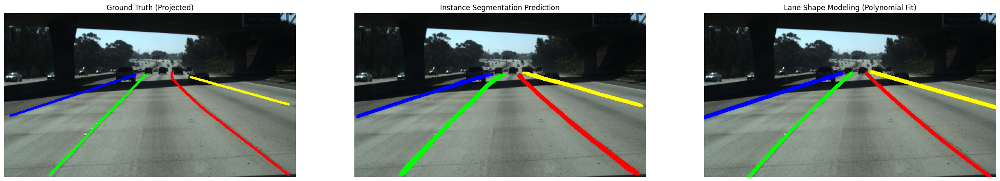

Fitting Shapes:   0%|          | 10/3626 [00:03<18:37,  3.24it/s]

Lane 1 Equation: x = 0.001199*y^2 + -1.938993*y + 457.186295
Lane 3 Equation: x = 0.004637*y^2 + 1.409691*y + 105.130241


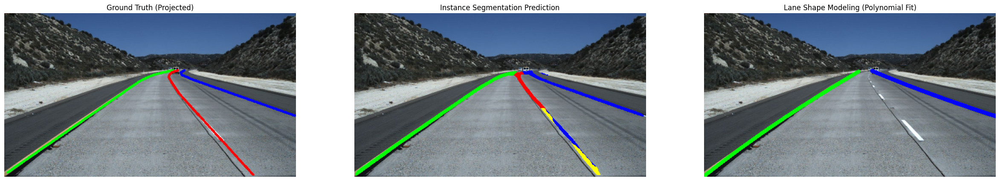

Fitting Shapes:   0%|          | 11/3626 [00:03<19:03,  3.16it/s]

Lane 1 Equation: x = -0.000695*y^2 + -0.687878*y + 334.657861
Lane 2 Equation: x = 0.000113*y^2 + 1.070621*y + 163.318138
Lane 3 Equation: x = 0.001174*y^2 + -3.241362*y + 564.298866
Lane 4 Equation: x = 0.005917*y^2 + 1.262193*y + 117.237806


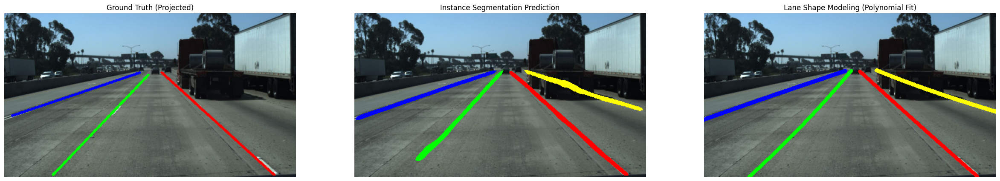

Fitting Shapes:   0%|          | 12/3626 [00:03<18:59,  3.17it/s]

Lane 1 Equation: x = -0.000068*y^2 + -0.972967*y + 352.861729
Lane 2 Equation: x = -0.000405*y^2 + 1.397431*y + 121.657955
Lane 3 Equation: x = 0.001431*y^2 + -3.406608*y + 578.927905
Lane 4 Equation: x = -0.013677*y^2 + 7.625779*y + -386.700856


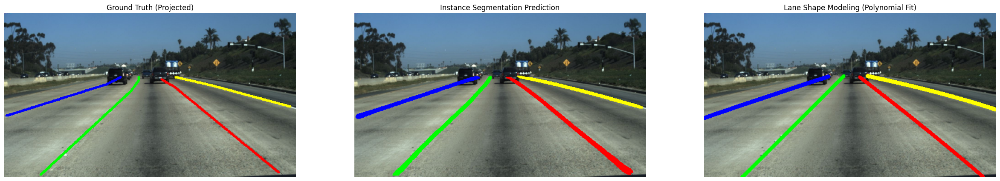

Fitting Shapes:   0%|          | 13/3626 [00:04<18:57,  3.18it/s]

Lane 1 Equation: x = 0.000498*y^2 + -1.023723*y + 365.157260
Lane 2 Equation: x = 0.000571*y^2 + 1.166840*y + 159.863805
Lane 3 Equation: x = 0.004745*y^2 + -4.364609*y + 651.959252
Lane 4 Equation: x = -0.010755*y^2 + 6.218396*y + -218.931809


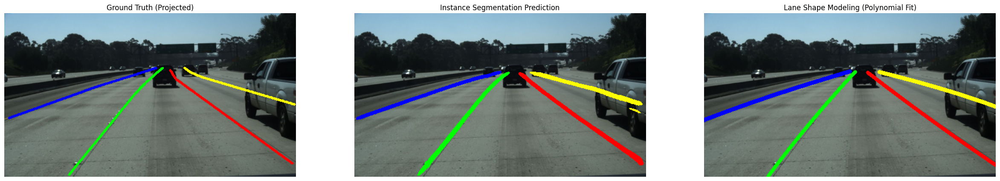

Fitting Shapes:   0%|          | 14/3626 [00:04<19:05,  3.15it/s]

Lane 1 Equation: x = 0.002216*y^2 + -2.042014*y + 454.492170
Lane 2 Equation: x = 0.001447*y^2 + 0.511011*y + 208.927290
Lane 3 Equation: x = 0.011768*y^2 + -6.950782*y + 850.553819
Lane 4 Equation: x = 0.005465*y^2 + 1.369195*y + 100.158471


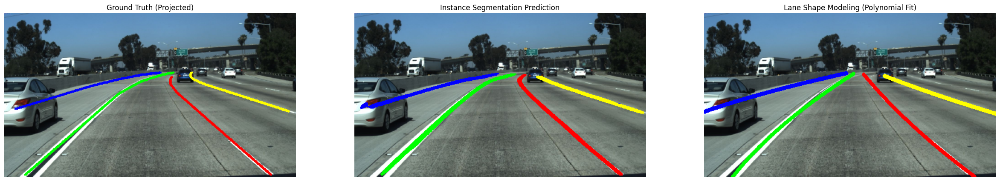

Fitting Shapes:   0%|          | 15/3626 [00:05<27:39,  2.18it/s]

Lane 1 Equation: x = 0.018334*y^2 + -9.085706*y + 951.050462
Lane 2 Equation: x = 0.008743*y^2 + -5.657621*y + 732.906867
Lane 3 Equation: x = 0.000235*y^2 + -1.066619*y + 364.843124


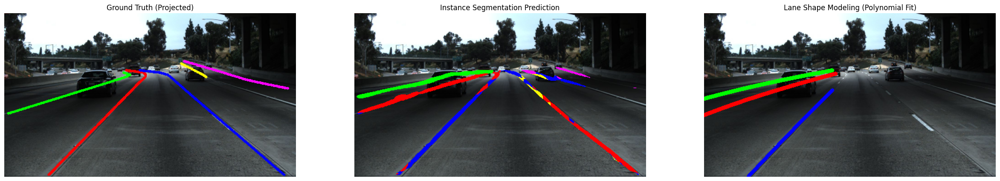

Fitting Shapes:   0%|          | 16/3626 [00:05<24:55,  2.41it/s]

Lane 1 Equation: x = -0.002689*y^2 + 0.308987*y + 206.295842
Lane 2 Equation: x = -0.002893*y^2 + 2.499960*y + 9.299436
Lane 3 Equation: x = -0.009841*y^2 + 0.465203*y + 239.454454
Lane 4 Equation: x = -0.016027*y^2 + 8.096617*y + -402.083336


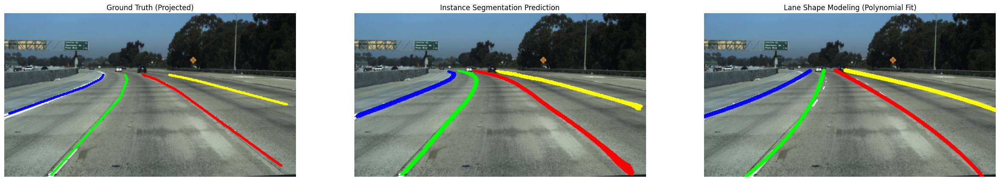

Fitting Shapes:   0%|          | 17/3626 [00:05<23:35,  2.55it/s]

Lane 1 Equation: x = 0.000226*y^2 + -1.132837*y + 370.271195
Lane 2 Equation: x = 0.000031*y^2 + 1.232185*y + 136.328436
Lane 3 Equation: x = -0.001304*y^2 + -2.510270*y + 500.861416
Lane 4 Equation: x = -0.014863*y^2 + 7.648411*y + -364.910101


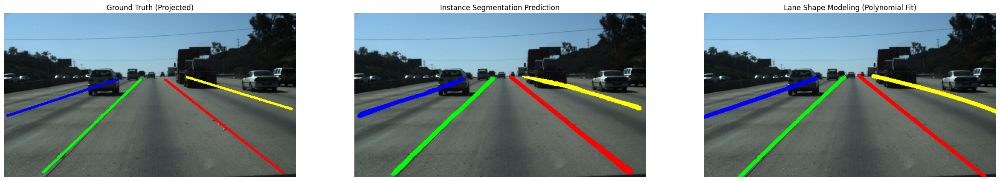

Fitting Shapes:   0%|          | 18/3626 [00:06<22:11,  2.71it/s]

Lane 1 Equation: x = 0.000173*y^2 + -1.037557*y + 359.821292
Lane 2 Equation: x = -0.000051*y^2 + 1.247369*y + 138.653872
Lane 3 Equation: x = 0.001269*y^2 + -3.391113*y + 577.692874
Lane 4 Equation: x = -0.002692*y^2 + 4.344000*y + -144.477893


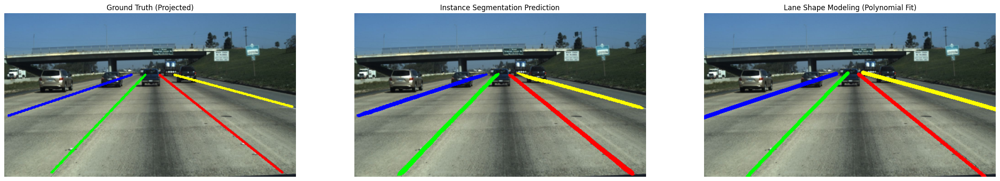

Fitting Shapes:   1%|          | 19/3626 [00:06<21:11,  2.84it/s]

Lane 1 Equation: x = -0.000263*y^2 + -0.639439*y + 327.251011
Lane 2 Equation: x = -0.000176*y^2 + 1.486593*y + 131.380543
Lane 3 Equation: x = 0.002656*y^2 + -3.387682*y + 565.912835
Lane 4 Equation: x = 0.001642*y^2 + 3.054525*y + -26.586998


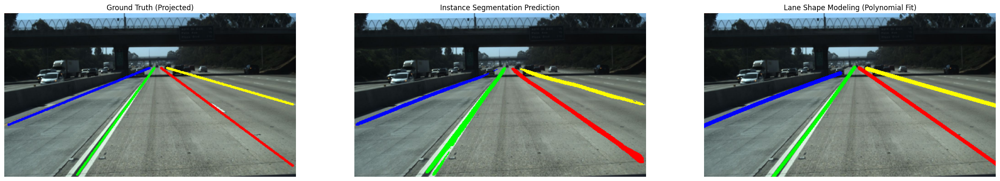

Fitting Shapes:   1%|          | 20/3626 [00:06<20:53,  2.88it/s]


In [40]:

# Run
json_files = ['label_data_0313.json', 'label_data_0531.json', 'label_data_0601.json']
evaluate_shapes(EVAL_MODEL_PATH, TRAIN_SET_DIR, PROCESSED_DATA_DIR, json_files, polynomial_degree)